# Описание проекта
**Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.**

- Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

- Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

- Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 
- Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 
- Она носит исключительно справочный характер.


# Описание данных
### Файл moscow_places.csv:
- •	name — название заведения;
- •	address — адрес заведения;
- •	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- •	hours — информация о днях и часах работы;
- •	lat — широта географической точки, в которой находится заведение;
- •	lng — долгота географической точки, в которой находится заведение;
- •	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- •	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

### avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽». и так далее;

### middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

### middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

### chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

### district — административный район, в котором находится заведение, например Центральный административный округ;
### seats — количество посадочных мест.

# Шаг 1. Загрузка данных и общая информация

Загрузим данные о заведениях общественного питания Москвы.
Путь к файлу: /datasets/moscow_places.csv
Изучим общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [2]:
path = 'E:/DA_Yandex/cafe_market_moscow/'
df = pd.read_csv(path + 'moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


- посмотрим информацию о таблице

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [5]:
print('Количество заведений:', df['name'].nunique())

Количество заведений: 5614


- Посмотрим заведения по категориям

In [6]:
df['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

- Данные выглядят корректно, приведем весь текст в нижний регистр.

In [7]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
df['avg_bill'] = df['avg_bill'].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


# Вывод
- Имеем 8406 строк в таблице, 5614 заведений, тип данных соответствует значениям, изменение названий столбцов не требуется.

# Шаг 2. Выполните предобработку данных

- Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [8]:
print('Количество явных строк-дубликатов:', df.duplicated().sum())

Количество явных строк-дубликатов: 0


In [9]:
#посчитаем количество пропусков в каждом столбце.
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [10]:
df[~df.duplicated(subset=['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


- В датасете обнаружено 4 неявных дубликата было 8406 стало 8402. Это очень маленькая величина, оставим все как есть.

- Видим пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
Пропусков в данных много. Просто удалить нельзя, будут искажения в исследовании. Поэтому оставим пропуски как есть

- Посмотрим на количество сидячих мест в заведениях, так как среди них есть заведение с подозртельным количеством мест 1288!?

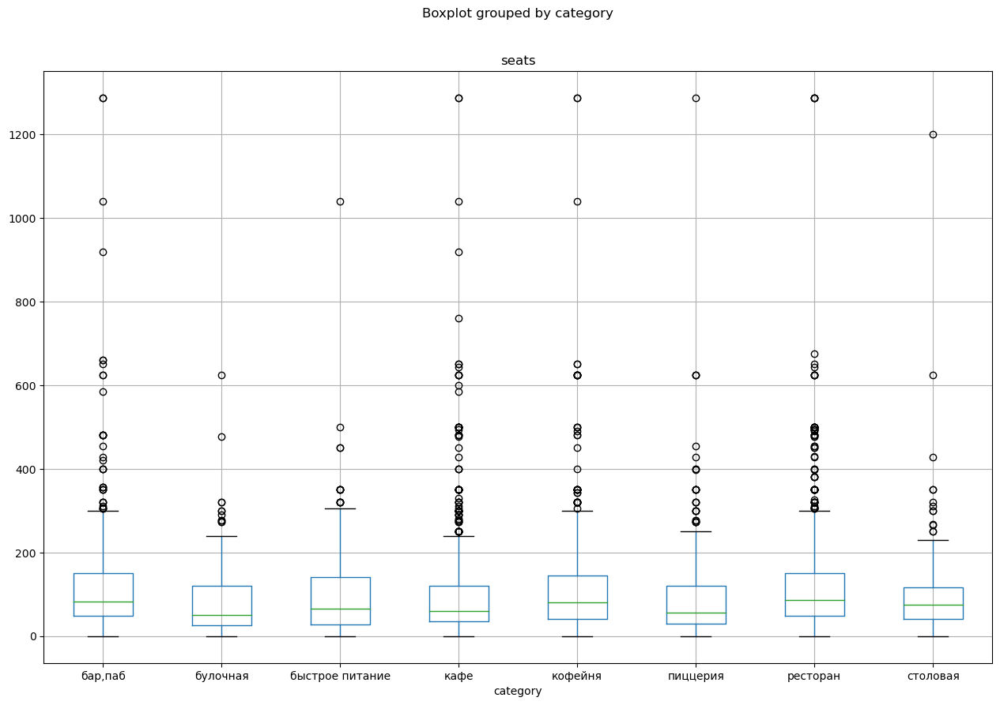

In [11]:
df.boxplot(column='seats', by='category', figsize=(15, 10))
plt.show();

- На графике видим выбросы. Скорее всего они связаны с ошибкой при заполнении данных (возможно приписан лишний 0). Оставим все, что меньше 600, посчитаем сколько заведений где количество мест больше 600

In [12]:
print('Заведений с числом мест больше 600:', df[df['seats'] > 600]['name'].count())

Заведений с числом мест больше 600: 53


- Таких заведений меньше 1%, удалим их.

In [13]:
df600 = df[df['seats'] > 600]
df = df.query('index not in @df600.index')
print('Заведений с числом мест больше 600:', df[df['seats'] > 600]['name'].count())


Заведений с числом мест больше 600: 0


**2.1 Создайте столбец street с названиями улиц из столбца с адресом.**
- Создадим столбец street с названиями улиц из столбца с адресом

In [14]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек','парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat, flags=re.I)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [15]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 529
lat                     0
lng                     0
rating                  0
price                5057
avg_bill             4559
middle_avg_bill      5220
middle_coffee_cup    7824
chain                   0
seats                3611
street                135
dtype: int64

In [16]:
df[df['street'].isna()].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,NaN
64,testo мания,кофейня,"москва, лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
73,веранда,ресторан,"москва, парк алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,NaN
137,get and fly,ресторан,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN


- В новом столбце street появились пропуски, оставим их как есть, их доля очень маленькая меньше 1%

***2.2  Создайте столбец is_24/7 с обозначением что заведение работате ежедневно и круглосуточно***
- Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [17]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


 **Предобработка данных завершена** 

# Шаг 3. Анализ данных

***Какие категории заведений представлены в данных?***

- Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [18]:
category_name = df.groupby('category')['name'].count().reset_index()
category_name.columns = ['category', 'count']
category_name

,category,count
0,"бар,паб",756
1,булочная,255
2,быстрое питание,602
3,кафе,2366
4,кофейня,1401
5,пиццерия,629
6,ресторан,2031
7,столовая,313


In [19]:
go.Figure(data=[go.Pie(labels=category_name['category'], values=category_name['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Круговая диаграмма распределения заведений по категориям")))

In [20]:
fig = px.bar(category_name, 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по видам'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show() # выводим график

# Вывод:

- По количеству заведений лидируют кафе с численностью 2366, немного меньше ресторан - 2031. На последнем месте булочная 255.
- Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары,пабы и пиццерии составляют 33,38% от общего числа заведений. На булочные, столовые и быстрое питание приходится 14,05%.

**Исследование количества посадочных мест в заведениях по категориям.***
- Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации

In [21]:
df.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",459.0,110.08,95.71,0.0,47.50,80.0,140.00,585.0
булочная,147.0,85.74,87.35,0.0,25.00,50.0,120.00,478.0
быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
кафе,1206.0,90.41,91.19,0.0,35.00,60.0,106.75,600.0
кофейня,739.0,100.43,90.99,0.0,40.00,78.0,140.00,500.0
пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
ресторан,1258.0,114.96,96.94,0.0,48.00,86.0,150.00,500.0
столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


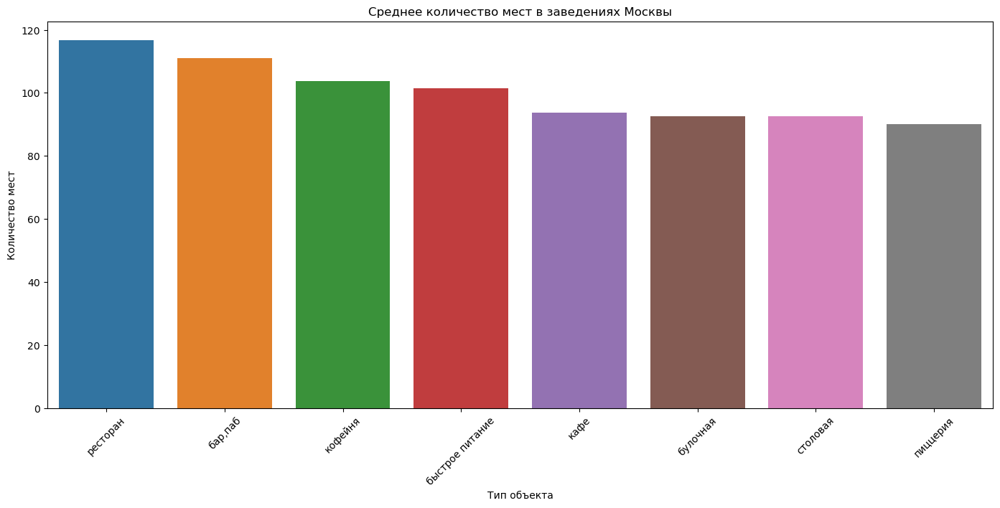

In [22]:
mean_seats = df[df['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(17, 7))

ax = sns.barplot(data=mean_seats, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

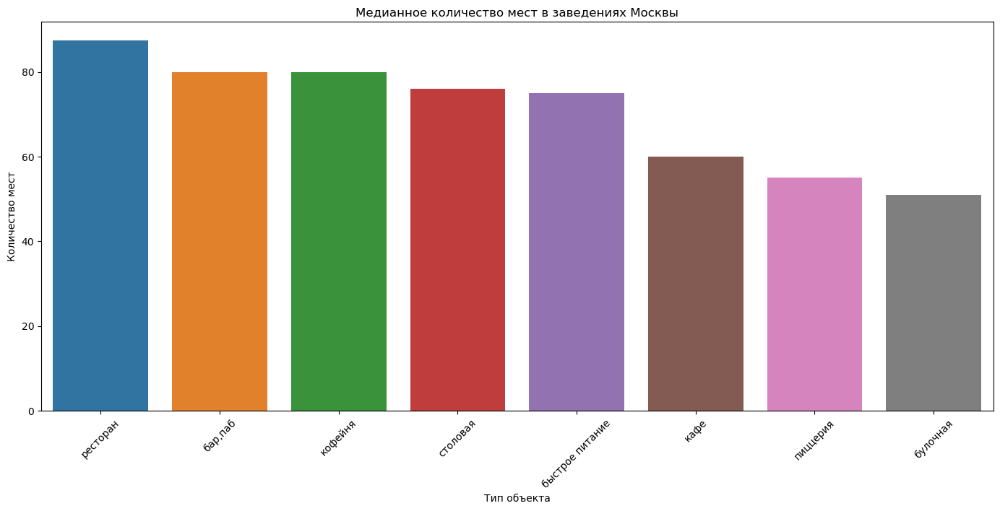

In [23]:
median_seats = df[df['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(17, 7))

ax = sns.barplot(data=median_seats, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

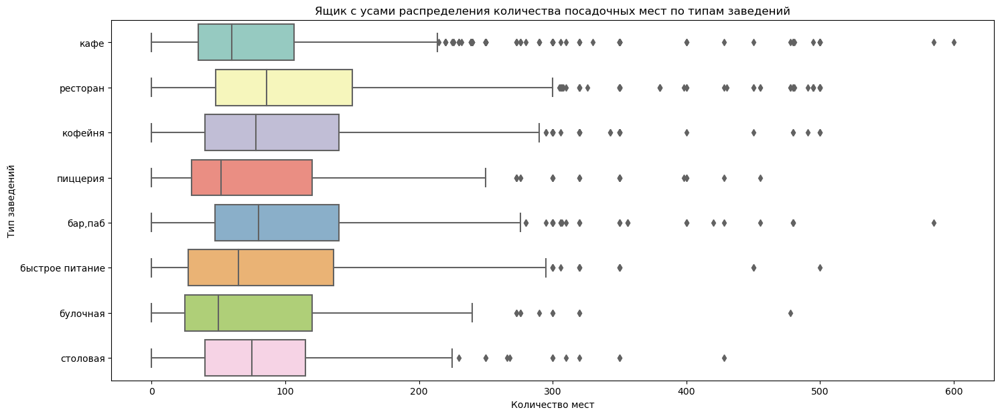

In [24]:
plt.figure(figsize=(17, 7))
ax = sns.boxplot(data=df, x='seats', y='category', palette="Set3")

plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

### Вывод:

- Больше всего посадочных мест предоставляют рестораны, что понятно, так как такова специфика этих заведений, люди приходят туда отдохнуть и поесть. Следом идут бары и пабы,кафейни, так как они больше всего распространены. Далее идут быстрое питание, столовые и остальные заведения.

***Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?***

In [25]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5174
1,1,3179


- Построим круговую диаграмму, она лучше покажет соотношение.

In [26]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

# Вывод:

- По диаграмме, мы можем сказать, что в Москве почти 62% заведений не являются сетевыми.

***Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.***

In [27]:
chain_objects = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['count', 'chain'])
chain_objects

,object_type,chain,count
15,столовая,1,87
2,булочная,0,99
3,булочная,1,156
1,"бар,паб",1,168
14,столовая,0,226
5,быстрое питание,1,231
10,пиццерия,0,301
11,пиццерия,1,328
4,быстрое питание,0,371
0,"бар,паб",0,588


In [28]:
fig = px.bar(chain_objects, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='object_type', # указываем столбец с данными для оси Y
             text='count', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]}
            )
# оформляем график
fig.update_layout(title='Соотношение сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                 )
fig.show() # выводим график

# Вывод:

- Напомним chain — число, выраженное 1 (сетевое) или 0 (не сетевое), которое показывает, является ли заведение сетевым.
- По графику мы видим, что в основной массе заведения не являются сетевыми.

***За исключением категорий:***

- кофейня - здесь количество сетевых немного больше (713/688)
- пиццерия - здесь сетевых точек уже заметно больше (328/301)
- булочная - здесь разница самая большая (156/99)

***Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию.***

- Знакомы ли вам эти сети? 
- Есть ли какой-то признак, который их объединяет?
- К какой категории заведений они относятся?

In [29]:
df_chain = df[df['chain'] == 1]
top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,38


In [30]:
fig = px.bar(top_15, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count', # добавляем аргумент, который отобразит текст с информацией
             color='category'  # о количестве объявлений внутри столбца графика
            )
# строим график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show() # выводим график

# Вывод:

- Из полученных данных мы видим, что самая популярная сеть в Москве - шоколадница. На втором и третьем месте известные пиццерии - домино'с пицца и додо пицца. Меньше всего заведений в сети му-му.

In [31]:
print('Всего заведений в Топ-15:', top_15['count'].sum())

Всего заведений в Топ-15: 811


In [32]:
district_chain = df_chain.groupby(['district', 'category', 'name']).agg({'rating' : 'median', 'address' : 'count'})
district_chain = district_chain.sort_values('rating', ascending = False).reset_index()
district_chain = district_chain.rename(columns={'address':'count'})
district_chain = district_chain[district_chain['name'].isin(top_15['name'])]
district_chain.head()

,district,category,name,rating,count
51,Юго-Восточный административный округ,кафе,хинкальная,4.9,3
60,Юго-Восточный административный округ,быстрое питание,хинкальная,4.9,2
95,Юго-Западный административный округ,кофейня,буханка,4.8,1
190,Центральный административный округ,булочная,буханка,4.7,1
270,Восточный административный округ,ресторан,теремок,4.6,1


In [33]:
fig = px.bar(district_chain, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             color='category'
            )
# строим график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                   )
fig.show() # выводим график

# ВЫВОД:

- Всего заведений в Топ-15: 811

- По графику видно, что больше всего заведений в категории кофейня. У ресторанов, пиццерий и кафе примерно одинаковое количество. У булочных в топ-15 меньше всего заведений.

- Больше всего заведений из топ-15 находятся в Центральный административный округе. Преимущественно категории кафе, кофейни и рестораны.

- Примерно одинаково у Южного административного округа, Северного административного округа, Западного административного округа и Северо-Восточного административного округа. 
- Меньше всего заведений из топ-15 в Северо-Западном административном округе.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [34]:
print('Общее количество заведений в датасете:',df['name'].count())

Общее количество заведений в датасете: 8353


In [35]:
district_chain_df = df.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
district_chain_df = district_chain_df.sort_values('rating', ascending = False).reset_index()
district_chain_df = district_chain_df.rename(columns={'name':'count'})
district_chain_df.head()

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.50,364
1,Западный административный округ,"бар,паб",4.45,46
2,Северо-Западный административный округ,"бар,паб",4.40,23
3,Северный административный округ,"бар,паб",4.40,66
4,Центральный административный округ,ресторан,4.40,670


In [36]:
fig = px.bar(district_chain_df, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                   )
fig.show() # выводим график

In [37]:
print('Административные районы Москвы в датасете:')
print()
print(district_chain['district'].unique())

Административные районы Москвы в датасете:

['Юго-Восточный административный округ'
 'Юго-Западный административный округ'
 'Центральный административный округ' 'Восточный административный округ'
 'Северо-Западный административный округ'
 'Северо-Восточный административный округ'
 'Западный административный округ' 'Северный административный округ'
 'Южный административный округ']


# ВЫВОД:

- Всего в Москве в датасете представлено 9 округов.
- По графику видно, что больше всего заведений по всем категориям находится в центральном административном округе. Больше всего в нем категорий кафе,  ресторан, кофейня, что вполне логично, так как люди приезжают в центр города отдыхать, гулять или за покупками. В целом категории заведений кафе и ресторнаы хорошо распределены по всем округам. Столовых меньше всего по всем округам.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [38]:
rating_category = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [44]:
fig = px.bar(rating_category, # загружаем данные и заново их сортируем
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show() # выводим график

In [40]:
fig = px.bar(rating_category, # загружаем данные и заново их сортируем
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[3.5, 5])
fig.show() # выводим график

# ВЫВОД:

- Из графика выше мы видим, что самый большой рейтинг в категории бар/паб. У пиццерий, ресторанов, кофеен и булочных примерно одинаковый рейтинг. Самый маленький у ресторанов быстрого питания.
- Также мы видим, что в нашей выборке средние значения по категориям выше 4

***Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).***

In [41]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [42]:
# подключаем модуль для работы с JSON-форматом
import json

In [45]:
# читаем файл и сохраняем в переменной
with open('E:/DA_Yandex/cafe_market_moscow/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [47]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'E:/DA_Yandex/cafe_market_moscow/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

# ВЫВОД:

- По данным видно, что самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [49]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

 # ВЫВОД:
 
 - По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [50]:
streets_moscow = df[df['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street_name', 'count']
top15_streets

,street_name,count
0,проспект мира,184
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,75
7,ленинградский проспект,72
8,ленинградское шоссе,69
9,мкад,65


In [51]:
#создадим таблицу с названиями улиц и категорий
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street_name,category,count
2080,проспект мира,кафе,53
1499,мкад,кафе,45
2083,проспект мира,ресторан,45
2081,проспект мира,кофейня,36
2092,профсоюзная улица,кафе,35
...,...,...,...
1496,мишина улица,кофейня,1
1497,мкад,"бар,паб",1
1502,мкад,столовая,1
1506,можайское шоссе,пиццерия,1


In [52]:
#оставим только улицы из топ 15
streets15_category = streets_category[streets_category['street_name'].isin(top15_streets['street_name'])]
streets15_category

,street_name,category,count
320,алтуфьевское шоссе,"бар,паб",5
321,алтуфьевское шоссе,булочная,1
322,алтуфьевское шоссе,быстрое питание,5
323,алтуфьевское шоссе,кафе,13
324,алтуфьевское шоссе,кофейня,9
...,...,...,...
2722,улица вавилова,быстрое питание,11
2723,улица вавилова,кафе,15
2724,улица вавилова,кофейня,10
2725,улица вавилова,пиццерия,3


In [53]:
fig = px.bar(streets15_category, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений по топ-15 по улицам Москвы по каждой категори',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                   )
fig.show() # выводим график

# ВЫВОД:

- Из графика выше мы видим, что больше всего заведений на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего.Следом за ним идет Профсоюзная, ситуация с категориями там аналогична.
- Меньше всего заведений на улица Алтуфевское шоссе. Среди популярных категорий также кафе и рестораны.

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [54]:
one_cafe = df['street'].value_counts().reset_index()
one_cafe.columns = ['street_name', 'cafe_count']
one_cafe = one_cafe[one_cafe['cafe_count'] == 1]
one_cafe

,street_name,cafe_count
969,сумской проезд,1
970,улица генерала глаголева,1
971,улица академика ильюшина,1
972,3-й лучевой просек,1
973,савёловская линия,1
...,...,...
1389,улица демьяна бедного,1
1390,улица неверовского,1
1391,промышленный проезд,1
1392,тучковская улица,1


In [ ]:
#добавим районы
streets1_category = streets_category[streets_category['street_name'].isin(one_cafe['street_name'])]
streets1_category = streets1_category.groupby('category')['street_name'].count()
streets1_category


# ВЫВОД:

- Из данных выше мы видим, что 425 улиц имеют только одно заведение общепита. Больше всего из них относятся к категории кафе - 142 единицы.

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [55]:
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [56]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

# ВЫВОД:

- По данным выше мы видим, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. 
- Из таблицы выше видно, что средний чек округов вокруг центрального в среднем отличается в 1,4 - 2,2 раза.


# Общий вывод по проекту

- Проведя анализ мы выяснили что общее количество завдений 5614, из них по количеству заведений лидируют кафе с численностью 2366, немного меньше ресторан - 2031. На последнем месте булочная - 255.

- Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,38% от общего числа заведений. На булочные, столовые и быстрое питание приходится 14,85%.

- Также мы увидели, что больше всего посадочных мест предоставляют рестораны, что понятно, так как такова специфика этих заведений, люди приходят туда отдохнуть и поесть. Следом идут заведения быстрого питания, так как они больше всего распространены. Для кафе и столовых посадочных мест меньше всего.

- В Москве почти 62% заведений не являются сетевыми, что составляет основную массу заведений, за исключением категорий: кофейня - здесь количество сетевых немного больше (713/688) пиццерия - здесь сетевых точек уже заметно больше (328/301) булочная - здесь разница самая большая (156/99)

- Самая популярная сеть в Москве - шоколадница. На втором и третьем месте известные пиццерии - домино'с пицца и додо пицца. Меньше всего заведений в сети му-му.

- Всего заведений в Топ-15: 811

- Больше всего заведений в категории кофейня. У ресторанов, пиццерий и кафе примерно одинаковое количество. У булочных в топ-15 меньше всего заведений.

- Больше всего заведений из топ-15 находятся в Центральный административный округе. Преимущественно категории кафе, кофейни и рестораны. Примерно одинаково у Южного административного округа, Северного административного округа, Западного административного округа и Северо-Восточного административного округа. Меньше всего заведений из топ-15 в Северо-Западном административном округе.

- Всего в Москве в датасете представлено 9 округов. По графику видно, что больше всего заведений по всем категориям находится в центральном административном округе. Больше всего в нем категорий кафе, ресторан, кофейня, что вполне логично, так как люди приезжают в центр города отдыхать, гулять или за покупками. В целом категории заведений кафе и ресторнаы хорошо распределены по всем округам. Столовых меньше всего по всем округам.

- Самый большой рейтинг в категории бар/паб. У пиццерий, ресторанов, кофеен и булочных примерно одинаковый рейтинг. Самый маленький у ресторанов быстрого питания. Также мы видим, что в нашей выборке средние значения по категориям выше 4.

- Самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.

- Мы выяснили что сновная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

- Больше всего заведений расположены на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего.Следом за ним идет Профсоюзная, ситуация с категориями там аналогична. Меньше всего заведений на улице Алтуфевское шоссе. Среди популярных категорий также кафе и рестораны.

- Из данных выше мы видим, что 425 улиц имеют только одно заведение общепита. Больше всего из них относятся к категории кафе - 142 единицы.

- Мы выяснили, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Средний чек округов вокруг Центрального в среднем отличается в 1,4 - 2,2 раза.

# Шаг 4. Детализируем исследование: открытие кофейни

**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

- Постройте визуализации.
- Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. 
- Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте

In [57]:
cofe_df = df[df['category'] == 'кофейня']
print('Всего коффен:', cofe_df.shape[0])

Всего коффен: 1401


In [58]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_df.apply(create_clusters, axis=1)

# выводим карту
m3

# ВЫВОД:

- Всего в Москве 1401 кофеен. Больше всего в Центральном округе-406. Следом на юго-востоке-222 и на юго-западе-164 города.

**Есть ли круглосуточные кофейни?**

In [59]:
cofe_24_7 = cofe_df[cofe_df['is_24/7'] == True]
print('Круглосуточных коффен:', cofe_24_7.shape[0])

Круглосуточных коффен: 59


In [60]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_24_7.apply(create_clusters, axis=1)

# выводим карту
m4

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [61]:
rating_cofe = cofe_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cofe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [62]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m5)

# выводим карту
m5

# ВЫВОД:

- Самый высокий рейтинг в округах: Центральный административный округ и Северо-Западный административный округ. Самый низкий рейтинг у Западного административного округа.

In [64]:
middle_cofe = cofe_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(middle_cofe)
print('Средняя стоимость чашки кофе в Москве:', middle_cofe['middle_coffee_cup'].mean())

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.22777777777776


In [65]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_cofe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средний цена чашки кофе по районам',
).add_to(m6)

# выводим карту
m6

# ВЫВОД:

- Самый дорогой кофе в Западном, Центральном и Юго-Западном округах, их средняя стоимость - 186,75. Средняя стоимость стоимость чашки кофе по всей Москве составляет 171.23.

- При открытии нового заведения, для формирования цены стоимости чашки кофе, стоит ориентироваться на район, в котором вы открываете заведение. Цена должна быть не выше средней по району.

# Рекомендация по результатам исследований:

- При открытии новой кофейни лучше выбрать Западный, Центральный или Юго-Западный округа, так как высокая средняя стоимость чашки кофе позволит иметь хорошую маржинальность. Также это позволит при запуске заведения снизить стоимость чашки кофе для старта, без серьезных потерь.

- Стоит рассмотреть круглосуточный режим работы. На Западном и Юго-Западном округах явный недостаток круглосуточных точек. В Центральном округе также лучше рассмотреть формат 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в ночное время.
- Также у заведений западного направления мы отметили низкий рейтинг заведений. Это можно использовать как преимущество при старте.

**Презентация https://disk.yandex.ru/i/iJ0bq8Wehm7mUQ**